# Music Recommendation System

In [1]:
#Import Libraries

In [2]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
#import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_csv("C:/Users/antar/Downloads/ML Projects/ANTARA/Spotify/data.csv")
genre_data = pd.read_csv('C:/Users/antar/Downloads/ML Projects/ANTARA/Spotify/data_by_genres.csv')
year_data = pd.read_csv('C:/Users/antar/Downloads/ML Projects/ANTARA/Spotify/data_by_year.csv')

In [4]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [5]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [6]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [7]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [8]:
genre_data.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [9]:
year_data.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5


In [10]:
year_data.isnull().sum()

mode                0
year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
dtype: int64

In [11]:
data.year.describe()

count    170653.000000
mean       1976.787241
std          25.917853
min        1921.000000
25%        1956.000000
50%        1977.000000
75%        1999.000000
max        2020.000000
Name: year, dtype: float64

In [12]:
#Calculating total product sold in a month-

df_Total= data.groupby("year").name.sum().reset_index()
df_Total.head()

,year,name
0,1921,"Piano Concerto No. 3 in D Minor, Op. 30: III. ..."
1,1922,CarveVivo para Quererte - RemasterizadoEl Pris...
2,1923,Weather BirdNobody Knows You When You're Down ...
3,1924,In My Merry OldsmobileMississippi Mud (feat. B...
4,1925,"On the Sunny Side of the Street (From ""Is Ever..."


<AxesSubplot:xlabel='year', ylabel='popularity'>

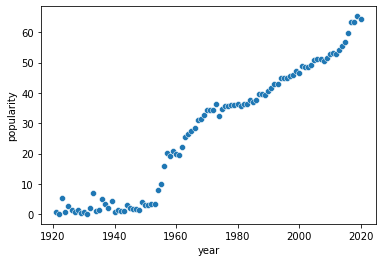

In [13]:
sns.scatterplot(data=year_data, x="year", y="popularity")

<AxesSubplot:xlabel='year', ylabel='popularity'>

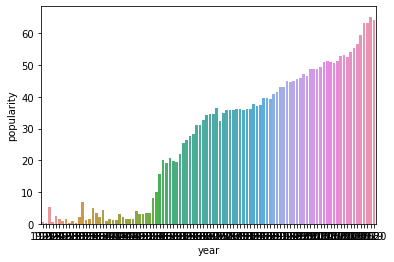

In [14]:
sns.barplot(data=year_data, x="year", y="popularity")

<AxesSubplot:>

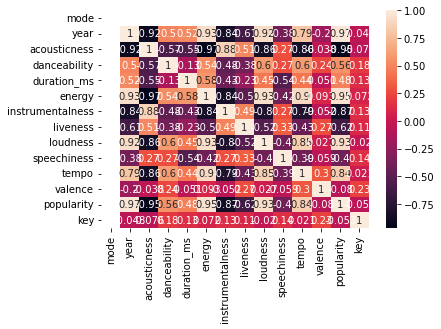

In [15]:
sns.heatmap(year_data.corr(), annot=True)

In [119]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [16]:
import plotly.express as px

fig = px.scatter(year_data[:100],
          x='danceability',
          y='popularity',
          color='year')
          #size='contribution')
fig.show()

<AxesSubplot:xlabel='popularity', ylabel='Density'>

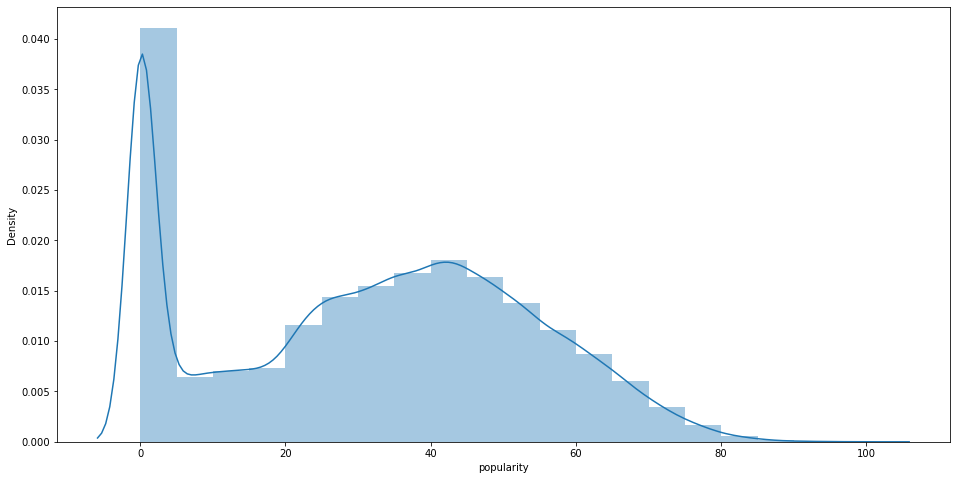

In [17]:
plt.figure(figsize=(16, 8))
sns.distplot(data.popularity,bins=20)

In [18]:
fig = px.scatter(data[:100],
          x='popularity',
          y='year',
          color='artists')
          #size='contribution')
fig.show()

<AxesSubplot:>

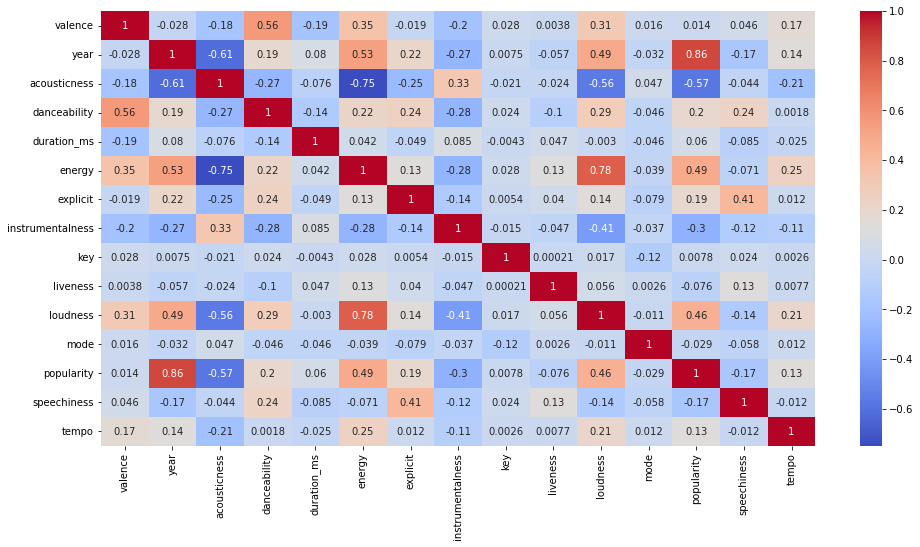

In [19]:
plt.figure(figsize=(16, 8))
corr = data.corr()
sns.heatmap(corr,annot=True,cmap="coolwarm")

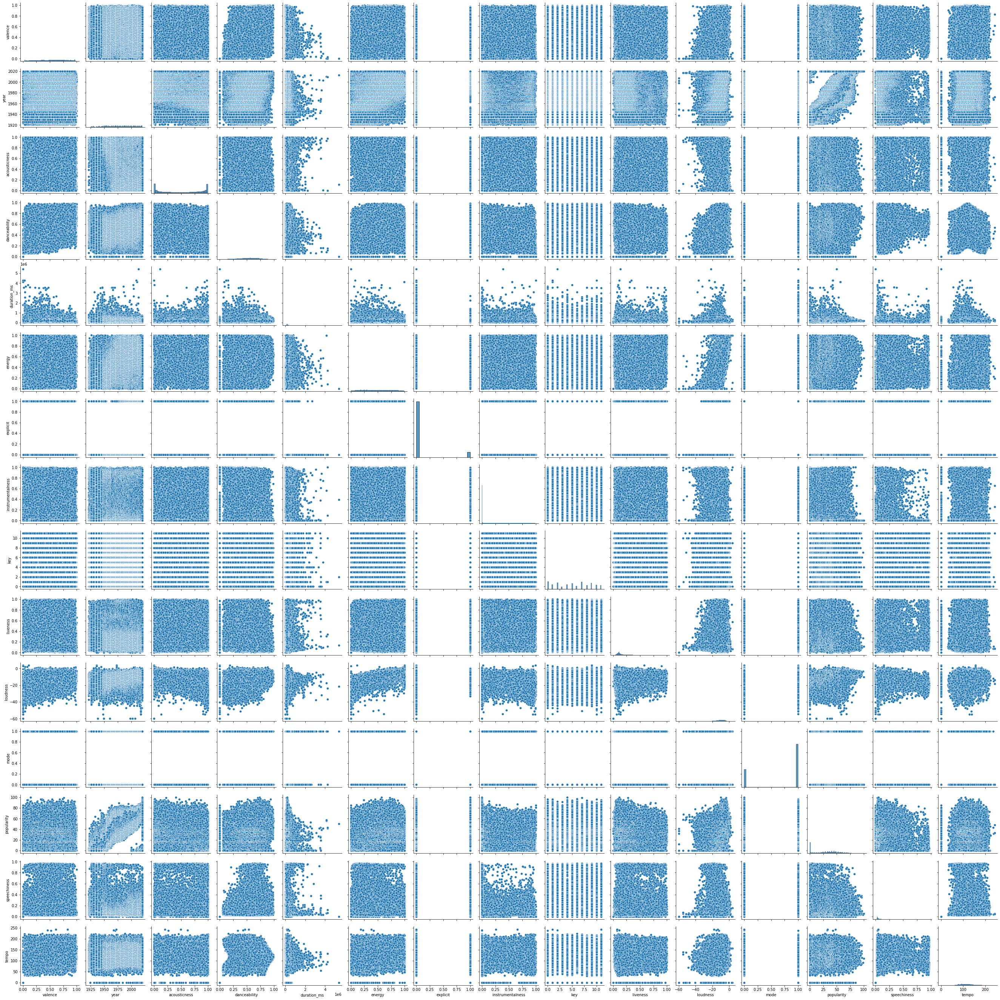

In [20]:
sns.pairplot(data, height = 2.5 )
plt.show();

<AxesSubplot:xlabel='decade', ylabel='count'>

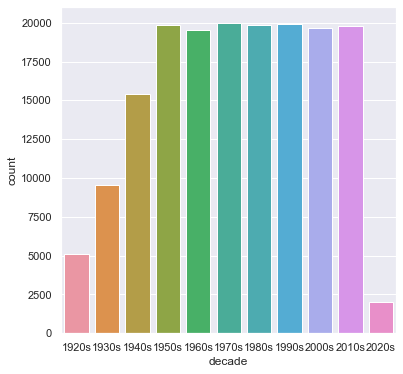

In [21]:
#grouping the year data in decades, to understand change in music over decades
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(6 ,6)})
sns.countplot(data['decade'])

In [24]:
#we'll now visualize the changes in the different feautures of music over the years

music_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=music_features)
fig.show()

In [25]:
fig = px.line(genre_data, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'])
fig.show()

#there are too many genres, so the graph is very messy, next we'll consider only top 10 genre based on popularity

In [26]:
top10_genres = genre_data.nlargest(10, 'popularity')
print(top10_genres)

      mode               genres  acousticness  danceability    duration_ms  \
237      1             basshall      0.213167       0.81800  169799.166667   
2533     1  south african house      0.043833       0.84700  311854.333333   
2755     1      trap venezolano      0.044600       0.87700  231848.000000   
2778     0          turkish edm      0.008290       0.69800  186700.000000   
46       0      alberta hip hop      0.330000       0.88500  144000.000000   
536      0   chinese electropop      0.002570       0.66000  217088.000000   
37       0            afroswing      0.318450       0.71175  179995.375000   
31       0            afro soul      0.006270       0.76600  202627.000000   
575      1              circuit      0.009030       0.74500  189818.000000   
1239     1             guaracha      0.009030       0.74500  189818.000000   

        energy  instrumentalness  liveness  loudness  speechiness       tempo  \
237   0.630167          0.000020  0.081067 -6.627833     0.1

In [27]:
fig1 = px.line(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness','liveness'])
fig1.show()

fig2 = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness','liveness'], barmode='group')
fig2.show()

In [28]:
#k-means clustering


In [29]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [30]:
#knn- genre
genre_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                             ('kmeans', KMeans(n_clusters=10, n_jobs=-1))])
X = genre_data.select_dtypes(np.number)
genre_cluster_pipeline.fit(X)
genre_data['cluster'] = genre_cluster_pipeline.predict(X)

In [31]:
#knn-song
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False, n_jobs=4))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [32]:
#Build the recommendation system


In [33]:
#first let's normalize our data
def normalize_column(col):
    max_d = data[col].max()
    min_d = data[col].min()
    data[col] = (data[col] - min_d)/(max_d - min_d)

In [34]:
num_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num = data.select_dtypes(include=num_types)
        
for col in num.columns:
    normalize_column(col)

In [35]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=10)
cat = km.fit_predict(num)
data['cat'] = cat
normalize_column('cat')

In [36]:
data.cat[:10]

0    0.666667
1    0.555556
2    0.333333
3    0.222222
4    0.555556
5    0.888889
6    0.555556
7    0.222222
8    0.555556
9    0.222222
Name: cat, dtype: float64

In [37]:
from tqdm import tqdm
class SpotifyRecommender():
    def __init__(self, rec_data):
        #our class should understand which data to work with
        self.rec_data_ = rec_data
    
    #if we need to change data
    def change_data(self, rec_data):
        self.rec_data_ = rec_data
    
    #function which returns recommendations, we can also choose the amount of songs to be recommended
    def get_recommendations(self, song_name, amount=1):
        distances = []
        #choosing the data for our song
        song = self.rec_data_[(self.rec_data_.name.str.lower() == song_name.lower())].head(1).values[0]
        #dropping the data with our song
        res_data = self.rec_data_[self.rec_data_.name.str.lower() != song_name.lower()]
        for r_song in tqdm(res_data.values):
            dist = 0
            for col in np.arange(len(res_data.columns)):
                #indeces of non-numerical columns
                if not col in [1, 6, 12, 14, 18]:
                    #calculating the manhettan distances for each numerical feature
                    dist = dist + np.absolute(float(song[col]) - float(r_song[col]))
            distances.append(dist)
        res_data['distance'] = distances
        #sorting our data to be ascending by 'distance' feature
        res_data = res_data.sort_values('distance')
        columns = ['artists', 'name']
        return res_data[columns][:amount]

In [42]:
recommender = SpotifyRecommender(data)

In [ ]:
recommender.get_recommendations('danny boy', 5)